# 07. PyTorch Experiemnt Tracking

ML is very experimental.

In order to figure out which experiments are worth pursuing, that's where **experiments tracking** comes in, it helps you to figure out what doesn't work so you can figure out what **does** work.

In this notebook, we're going to see an example of programmatically tracking experiments.

In [1]:
import torch
import torchvision

print(torch.__version__)
print(torchvision.__version__)

2.3.1+cu121
0.18.1+cu121


In [2]:
try:
  import torch
  import torchvision
  assert int(torch.__version__.split('.')[0]) >= 2, 'Upgrade'
  assert int(torchvision.__version__.split('.')[1]) >= 13, 'Upgrade'
except:
  !pip3 install torch torchvision --index-url https://download.pytorch.org/whl/cu121
  import torch
  import torchvision
  print(torch.__version__)
  print(torchvision.__version__)

In [3]:
import matplotlib.pyplot as plt
from torch import nn
from torchvision import transforms

try:
  from torchinfo import summary
except:
  !pip install -q torchinfo
  from torchinfo import summary

try:
  from going_modular.going_modular import data_setup, engine
except:
  !git clone https://github.com/mrdbourke/pytorch-deep-learning.git
  !mv pytorch-deep-learning/going_modular .
  !rm -rf pytorch-deep-learning

  from going_modular.going_modular import data_setup, engine

Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 4056, done.
remote: Total 4056 (delta 0), reused 0 (delta 0), pack-reused 4056
Receiving objects: 100% (4056/4056), 646.90 MiB | 17.00 MiB/s, done.
Resolving deltas: 100% (2371/2371), done.
Updating files: 100% (248/248), done.


In [4]:
# Setup device agnostic code

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [5]:
def set_seeds(seed: int = 42):
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)

In [6]:
set_seeds()

## 1. Get data

Want to get pizza, steak, sushi images.

So we can run experiments building FoodVision Mini and see which model performs best.

In [7]:
from pathlib import Path
import requests
from zipfile import ZipFile
import os

def download_data(source:str,
                  destination:str,
                  remove_resource:bool=True) -> Path:

  data = Path('data') / destination
  if data.is_dir() == False:
    data.mkdir(parents=True, exist_ok=True)

    target_file = Path(source).stem

    with open(data / target_file, 'wb') as f:
      response = requests.get(source)
      f.write(response.content)

    with ZipFile(data / target_file) as f:
      f.extractall(data)

    if remove_resource:
      os.remove(data / target_file)

  return data

In [8]:
image_path = download_data('https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip',
              'pizza_steak_sushi')

## 2. Create Datasets and DataLoaders

### 2.1 Create DataLoaders with manual transforms

The goal with transforms is to ensure your custom data is formatted in a reproducible way as well as a way that will suit pretrained models.

In [9]:
# Setup directories
train_dir = image_path / 'train'
test_dir = image_path / 'test'

In [10]:
manual_transform = transforms.Compose([transforms.Resize((224, 224)),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                            std=[0.229, 0.224, 0.225])])

print(manual_transform)

train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir,
                                                                               test_dir,
                                                                               manual_transform,
                                                                               32)

Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


### 2.2 Create DataLoaders using automatically created transform

The same principle applied for automatic transforms: we want our custom data in the same format as a pretrained model was trained on

In [11]:
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
automatic_transform = weights.transforms()

train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir,
                                                                               test_dir,
                                                                               automatic_transform,
                                                                               32)

In [12]:
automatic_transform

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

In [13]:
model = torchvision.models.efficientnet_b0(weights=weights).to(device)
model

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 104MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [14]:
for param in model.features.parameters():
  param.requires_grad = False

set_seeds()

model.classifier = nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(in_features=1280, out_features=len(class_names)).to(device)
)

In [15]:
summary(model,
        input_size=(32, 3, 224, 224),
        verbose=0,
        col_names=['input_size', 'output_size', 'num_params', 'trainable'],
        row_settings=['var_names'])

Layer (type (var_name))                                      Input Shape               Output Shape              Param #                   Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]         [32, 3]                   --                        Partial
├─Sequential (features)                                      [32, 3, 224, 224]         [32, 1280, 7, 7]          --                        False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]         [32, 32, 112, 112]        --                        False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]         [32, 32, 112, 112]        (864)                     False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]        [32, 32, 112, 112]        (64)                      False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]        [32, 32, 112, 112]        --         

## 4. Train a single model and track results

In [16]:
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters())

In [17]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()
print(writer)

To interact with TensorBoard, we can use PyTorch's SummaryWriter

In [18]:
from going_modular.going_modular.engine import train_step, test_step, train
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
  """Trains and tests a PyTorch model.

  Passes a target PyTorch models through train_step() and test_step()
  functions for a number of epochs, training and testing the model
  in the same epoch loop.

  Calculates, prints and stores evaluation metrics throughout.

  Args:
  model: A PyTorch model to be trained and tested.
  train_dataloader: A DataLoader instance for the model to be trained on.
  test_dataloader: A DataLoader instance for the model to be tested on.
  optimizer: A PyTorch optimizer to help minimize the loss function.
  loss_fn: A PyTorch loss function to calculate loss on both datasets.
  epochs: An integer indicating how many epochs to train for.
  device: A target device to compute on (e.g. "cuda" or "cpu").

  Returns:
  A dictionary of training and testing loss as well as training and
  testing accuracy metrics. Each metric has a value in a list for
  each epoch.
  In the form: {train_loss: [...],
            train_acc: [...],
            test_loss: [...],
            test_acc: [...]}
  For example if training for epochs=2:
            {train_loss: [2.0616, 1.0537],
            train_acc: [0.3945, 0.3945],
            test_loss: [1.2641, 1.5706],
            test_acc: [0.3400, 0.2973]}
  """
  # Create empty results dictionary
  results = {"train_loss": [],
              "train_acc": [],
              "test_loss": [],
              "test_acc": []
  }

  # Make sure model on target device
  model.to(device)

  # Loop through training and testing steps for a number of epochs
  for epoch in tqdm(range(epochs)):
    train_loss, train_acc = train_step(model=model,
                                      dataloader=train_dataloader,
                                      loss_fn=loss_fn,
                                      optimizer=optimizer,
                                      device=device)
    test_loss, test_acc = test_step(model=model,
      dataloader=test_dataloader,
      loss_fn=loss_fn,
      device=device)

    # Print out what's happening
    print(
      f"Epoch: {epoch+1} | "
      f"train_loss: {train_loss:.4f} | "
      f"train_acc: {train_acc:.4f} | "
      f"test_loss: {test_loss:.4f} | "
      f"test_acc: {test_acc:.4f}"
    )

    # Update results dictionary
    results["train_loss"].append(train_loss)
    results["train_acc"].append(train_acc)
    results["test_loss"].append(test_loss)
    results["test_acc"].append(test_acc)

    ### New: Experiment tracking ###
    writer.add_scalars(main_tag='Loss',
                       tag_scalar_dict={'train_loss': train_loss,
                                        'test_loss': test_loss},
                       global_step=epoch)

    writer.add_scalars(main_tag='Accuray',
                       tag_scalar_dict={'train_acc': train_acc,
                                        'test_acc': test_acc},
                       global_step=epoch
                       )

    writer.add_graph(model=model,
                     input_to_model=torch.randn(32, 3, 224, 224).to(device))

  # Return the filled results at the end of the epochs
  writer.close()
  return results

In [19]:
set_seeds()
results = train(model,
                train_dataloader,
                test_dataloader,
                optimizer,
                loss_fn,
                5,
                device)

  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.0924 | train_acc: 0.3984 | test_loss: 0.9133 | test_acc: 0.5398
Epoch: 2 | train_loss: 0.8975 | train_acc: 0.6562 | test_loss: 0.7837 | test_acc: 0.8561
Epoch: 3 | train_loss: 0.8038 | train_acc: 0.7461 | test_loss: 0.6723 | test_acc: 0.8864
Epoch: 4 | train_loss: 0.6770 | train_acc: 0.8516 | test_loss: 0.6699 | test_acc: 0.8049
Epoch: 5 | train_loss: 0.7065 | train_acc: 0.7188 | test_loss: 0.6746 | test_acc: 0.7737


## 5. View our model's results with TensorBoard

In [20]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

## 6. Create a function to prepare a `SummaryWriter()` instance

By default our `SummaryWriter()` class saves to `log_dir`.

How about if we wanted to save different experiments to different folders?

In essence, one experiment = one folder

For example, we'd like to track:
* Experiement date/timestamp
* Experiment name
* Model name
* Extra - is there anything else that should be tracked?

Let's create a function to create a `SummaryWriter()` instance to take all of these things into account.

So ideally we end up tracking experiments to a directory:

`runs/YYYY-MM-DD/experiment_name/model_name/extra`

In [21]:
from torch.utils.tensorboard import SummaryWriter

def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str = None):

  """ Create a torch.utils.tensorboard.writer.SummaryWriter() instance tracking to a specific directory.
  """

  from datetime import datetime
  import os

  # Get timestamp of current date in reverse order
  timestamp = datetime.now().strftime('%Y-%m-%d')

  if extra:
    # Create log directory path
    log_dir = os.path.join('runs', timestamp, experiment_name, model_name, extra)
  else:
    log_dir = os.path.join('runs', timestamp, experiment_name, model_name)

  print(f'[INFO] Created SummaryWriter saving to {log_dir}')

  return SummaryWriter(log_dir=log_dir)


In [22]:
create_writer('data_10_percent',
              'effnetb0',
              '5_epochs')

[INFO] Created SummaryWriter saving to runs/2024-08-11/data_10_percent/effnetb0/5_epochs


### 6.1 Update the `train()` function to include `writer` parameter

In [23]:
from going_modular.going_modular.engine import train_step, test_step, train
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter) -> Dict[str, List]:
  """Trains and tests a PyTorch model.

  Passes a target PyTorch models through train_step() and test_step()
  functions for a number of epochs, training and testing the model
  in the same epoch loop.

  Calculates, prints and stores evaluation metrics throughout.

  Args:
  model: A PyTorch model to be trained and tested.
  train_dataloader: A DataLoader instance for the model to be trained on.
  test_dataloader: A DataLoader instance for the model to be tested on.
  optimizer: A PyTorch optimizer to help minimize the loss function.
  loss_fn: A PyTorch loss function to calculate loss on both datasets.
  epochs: An integer indicating how many epochs to train for.
  device: A target device to compute on (e.g. "cuda" or "cpu").

  Returns:
  A dictionary of training and testing loss as well as training and
  testing accuracy metrics. Each metric has a value in a list for
  each epoch.
  In the form: {train_loss: [...],
            train_acc: [...],
            test_loss: [...],
            test_acc: [...]}
  For example if training for epochs=2:
            {train_loss: [2.0616, 1.0537],
            train_acc: [0.3945, 0.3945],
            test_loss: [1.2641, 1.5706],
            test_acc: [0.3400, 0.2973]}
  """
  # Create empty results dictionary
  results = {"train_loss": [],
              "train_acc": [],
              "test_loss": [],
              "test_acc": []
  }

  # Make sure model on target device
  model.to(device)

  # Loop through training and testing steps for a number of epochs
  for epoch in tqdm(range(epochs)):
    train_loss, train_acc = train_step(model=model,
                                      dataloader=train_dataloader,
                                      loss_fn=loss_fn,
                                      optimizer=optimizer,
                                      device=device)
    test_loss, test_acc = test_step(model=model,
      dataloader=test_dataloader,
      loss_fn=loss_fn,
      device=device)

    # Print out what's happening
    print(
      f"Epoch: {epoch+1} | "
      f"train_loss: {train_loss:.4f} | "
      f"train_acc: {train_acc:.4f} | "
      f"test_loss: {test_loss:.4f} | "
      f"test_acc: {test_acc:.4f}"
    )

    # Update results dictionary
    results["train_loss"].append(train_loss)
    results["train_acc"].append(train_acc)
    results["test_loss"].append(test_loss)
    results["test_acc"].append(test_acc)

    ### New: Experiment tracking ###
    if writer:
      writer.add_scalars(main_tag='Loss',
                        tag_scalar_dict={'train_loss': train_loss,
                                          'test_loss': test_loss},
                        global_step=epoch)

      writer.add_scalars(main_tag='Accuray',
                        tag_scalar_dict={'train_acc': train_acc,
                                          'test_acc': test_acc},
                        global_step=epoch
                        )

      writer.add_graph(model=model,
                      input_to_model=torch.randn(32, 3, 224, 224).to(device))

    # Return the filled results at the end of the epochs
    writer.close()

  else:
    pass

  return results

## 7. Setting up a series of modelling experiments

* Setup 2x modelling experiments with with effnetb0, pizza, steak, sushi data and train one model for 5 epochs and other model for 10 epochs

### 7.1 What kind of experiments should you run?

The number of machine learning experiments you can run, is like the number of different models you can build... almost limitless.

However, you can't test everything...

So what should you test?
* Change the number of epochs
* Change the number of hidden layers/units
* Change the amount of data (right now we're using 10% of the Food101 dataset for pizza, steak, sushi).
* Change the learning rate
* Try different kinds of data augmentation.
* Choose a different model architecture.

This is why transfer learning is so powerful, because, it's a working model that you can apply to your own problem.

### 7.2 What experiments are we going to run?

We're going to turn 3 dials:
1. Model size - EffnetB0 vs EffnetB2 (in terms of number of parameters)
2. Dataset size - 10% of pizza, steak, sushi images vs 20% (generally more data = better results)
3. Training time - 5 epochs vs 10 epochs (generally longer training time = better results, up to a point).

To begin, we're still keeping things relatively small so that our experiments run quickly.

**Our goal:** a model that is well performing but still small enough to run on a mobile device or web brower, so FoodVision Mini can come to life.

If you had infinite compute + time, you should basically always choose the biggest model and biggest dataset you can.

### 7.3 Download different datasets

We want two datasets:
1. Pizza, steak, sushi 10%
2. Pizza, steak, sushi 20%

In [24]:
# Download 10 percent and 20 percent datasets
data_10_percent_path = download_data(source='https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip',
                                     destination='pizza_steak_sushi')

data_20_percent_path = download_data(source='https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip',
                                     destination='pizza_steak_sushi_20_percent')

### 7.4 Transform Datasets and Create DataLoaders

We'll need to transform our data in a few ways:
1. Resize the image to (224, 224).
2. Make sure image tensor values are between [0, 1]
3. Normalize the image so they have the same distribution as ImageNet.

In [25]:
# Setup training directory paths
train_dir_10_percent = data_10_percent_path / 'train'
test_dir = data_10_percent_path / 'test'

train_dir_20_percent = data_20_percent_path / 'train'
test_dir_20_percent = data_20_percent_path / 'test'

In [26]:
from torchvision import transforms

manual_transform = transforms.Compose([transforms.Resize((224, 224)),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                            std=[0.229, 0.224, 0.225])])

BATCH_SIZE = 32

# Create 10% training and test DataLoaders
train_dataloader_10_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir_10_percent,
                                                                                          test_dir,
                                                                                          manual_transform,
                                                                                          BATCH_SIZE)

train_dataloader_20_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir_20_percent,
                                                                                          test_dir,
                                                                                          manual_transform,
                                                                                          BATCH_SIZE)

In [27]:
len(train_dataloader_10_percent), len(train_dataloader_20_percent)

(8, 15)

### 7.5 Create feature extractor models

We want 2 functions:
1. Create a `torchvision.models.efficientnet_b0()` feature extractor with a frozen backbone/base layers and a custom classifier  head.
2. Create a `torchvision.models.efficientnet_b2()` feature extractor with a frozen backbone/base layers and a custom classifier  head.

In [28]:
# weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
# effnetb0 = torchvision.models.efficientnet_b0(weights=weights)

effnetb2_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
effnetb2 = torchvision.models.efficientnet_b2(weights=effnetb2_weights)

effnetb2

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 178MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [29]:
len(effnetb2.state_dict().keys())

508

In [30]:
summary(effnetb2,
        input_size=(1, 3, 224, 224),
        verbose=0,
        col_names=['input_size', 'output_size', 'num_params', 'trainable'],
        col_width=20,
        row_settings=['var_names'])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [1, 3, 224, 224]     [1, 1000]            --                   True
├─Sequential (features)                                      [1, 3, 224, 224]     [1, 1408, 7, 7]      --                   True
│    └─Conv2dNormActivation (0)                              [1, 3, 224, 224]     [1, 32, 112, 112]    --                   True
│    │    └─Conv2d (0)                                       [1, 3, 224, 224]     [1, 32, 112, 112]    864                  True
│    │    └─BatchNorm2d (1)                                  [1, 32, 112, 112]    [1, 32, 112, 112]    64                   True
│    │    └─SiLU (2)                                         [1, 32, 112, 112]    [1, 32, 112, 112]    --                   --
│    └─Sequential (1)                                        [1, 32, 112, 112]    [1, 16, 112,

In [31]:
effnetb2.classifier[1].in_features

1408

In [32]:
import torchvision
from torch import nn

OUT_FEATURES = len(class_names)

# Create an EffNetB0 feature extractor
def create_effnetb0():
  weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
  model = torchvision.models.efficientnet_b0(weights=weights).to(device)

  for param in model.features.parameters():
    param.requires_grad = False

  set_seeds()
  model.classifier = nn.Sequential(model.classifier[0],
                                   nn.Linear(model.classifier[1].in_features, OUT_FEATURES)).to(device)

  model.name = 'effnetb0'
  print(f'[INFO] Create new {model.name} model...')

  return model


# Create an EffNetB2 feature extractor
def create_effnetb2():
  weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
  model = torchvision.models.efficientnet_b2(weights=weights).to(device)

  for param in model.features.parameters():
    param.requires_grad = False

  set_seeds()
  model.classifier = nn.Sequential(model.classifier[0],
                                   nn.Linear(model.classifier[1].in_features, OUT_FEATURES)).to(device)

  model.name = 'effnetb2'
  print(f'[INFO] Create new {model.name} model...')

  return model

### 7.6 Create experiments and set up training code

In [33]:
# Create epoch list
num_epochs = [5, 10]

# Create models list (need to create a new model for each experiment)
models = ['effnetb0', 'effnetb2']

# Create a DataLoaders directory
train_dataloaders = {'data_10_percent': train_dataloader_10_percent,
                     'data_20_percent': train_dataloader_20_percent}

In [35]:
%%time
from going_modular.going_modular.utils import save_model

# Set seeds
set_seeds(seed=42)

# Keep track of experiment numbers
experiment_number = 0

# Loop through each dataloader
for dataloader_name, train_dataloader in train_dataloaders.items():
  # Loop through each epochs
  for epochs in num_epochs:
    #Loop through each model name and create a new model instance
    for model_name in models:
      if model_name == 'effnetb0':
        model = create_effnetb0()
      else:
        model = create_effnetb2()

      loss_fn = torch.nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

      writer = create_writer(experiment_name = dataloader_name,
                              model_name=model_name,
                              extra=f'{epochs}_epochs')
      # Print out info
      experiment_number += 1
      print(f'[INFO] Experiment number: {experiment_number}')
      print(f'[INFO] Model: {model_name}')
      print(f'[INFO] DataLoader: {dataloader_name}')
      print(f'[INFO] Epochs: {epochs}')

      train(model,
            train_dataloader,
            test_dataloader,
            optimizer,
            loss_fn,
            epochs,
            device,
            writer)

      # Save model to file
      target_dir = 'models'
      save_model(model, target_dir, f'{dataloader_name}_{model_name}_{epochs}.pth')

      print('='*50 +'\n')

[INFO] Create new effnetb0 model...
[INFO] Created SummaryWriter saving to runs/2024-08-11/data_10_percent/effnetb0/5_epochs
[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Epochs: 5


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.0434 | train_acc: 0.4844 | test_loss: 0.9280 | test_acc: 0.4782
Epoch: 2 | train_loss: 0.9398 | train_acc: 0.5391 | test_loss: 0.8326 | test_acc: 0.5597
Epoch: 3 | train_loss: 0.8216 | train_acc: 0.7031 | test_loss: 0.7280 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7013 | train_acc: 0.7773 | test_loss: 0.6176 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6141 | train_acc: 0.8867 | test_loss: 0.5818 | test_acc: 0.8864
[INFO] Saving model to: models/data_10_percent_effnetb0_5.pth

[INFO] Create new effnetb2 model...
[INFO] Created SummaryWriter saving to runs/2024-08-11/data_10_percent/effnetb2/5_epochs
[INFO] Experiment number: 2
[INFO] Model: effnetb2
[INFO] DataLoader: data_10_percent
[INFO] Epochs: 5


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0845 | train_acc: 0.3984 | test_loss: 0.9591 | test_acc: 0.6903
Epoch: 2 | train_loss: 0.8949 | train_acc: 0.6445 | test_loss: 0.9036 | test_acc: 0.6818
Epoch: 3 | train_loss: 0.8490 | train_acc: 0.6758 | test_loss: 0.8055 | test_acc: 0.8049
Epoch: 4 | train_loss: 0.7029 | train_acc: 0.8516 | test_loss: 0.6937 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7016 | train_acc: 0.7305 | test_loss: 0.6516 | test_acc: 0.8968
[INFO] Saving model to: models/data_10_percent_effnetb2_5.pth

[INFO] Create new effnetb0 model...
[INFO] Created SummaryWriter saving to runs/2024-08-11/data_10_percent/effnetb0/10_epochs
[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Epochs: 10


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0434 | train_acc: 0.4844 | test_loss: 0.9280 | test_acc: 0.4782
Epoch: 2 | train_loss: 0.9398 | train_acc: 0.5391 | test_loss: 0.8326 | test_acc: 0.5597
Epoch: 3 | train_loss: 0.8216 | train_acc: 0.7031 | test_loss: 0.7280 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7013 | train_acc: 0.7773 | test_loss: 0.6176 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6141 | train_acc: 0.8867 | test_loss: 0.5818 | test_acc: 0.8864
Epoch: 6 | train_loss: 0.5409 | train_acc: 0.8750 | test_loss: 0.5932 | test_acc: 0.8561
Epoch: 7 | train_loss: 0.6397 | train_acc: 0.7031 | test_loss: 0.5925 | test_acc: 0.8561
Epoch: 8 | train_loss: 0.5071 | train_acc: 0.8008 | test_loss: 0.5386 | test_acc: 0.8968
Epoch: 9 | train_loss: 0.4676 | train_acc: 0.9219 | test_loss: 0.5325 | test_acc: 0.8759
Epoch: 10 | train_loss: 0.5791 | train_acc: 0.7344 | test_loss: 0.4894 | test_acc: 0.8759
[INFO] Saving model to: models/data_10_percent_effnetb0_10.pth

[INFO] Create new effnetb2 model...
[INFO] Cr

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0845 | train_acc: 0.3984 | test_loss: 0.9591 | test_acc: 0.6903
Epoch: 2 | train_loss: 0.8949 | train_acc: 0.6445 | test_loss: 0.9036 | test_acc: 0.6818
Epoch: 3 | train_loss: 0.8490 | train_acc: 0.6758 | test_loss: 0.8055 | test_acc: 0.8049
Epoch: 4 | train_loss: 0.7029 | train_acc: 0.8516 | test_loss: 0.6937 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7016 | train_acc: 0.7305 | test_loss: 0.6516 | test_acc: 0.8968
Epoch: 6 | train_loss: 0.5989 | train_acc: 0.7695 | test_loss: 0.6595 | test_acc: 0.8769
Epoch: 7 | train_loss: 0.6212 | train_acc: 0.8047 | test_loss: 0.6043 | test_acc: 0.9384
Epoch: 8 | train_loss: 0.5351 | train_acc: 0.8242 | test_loss: 0.6012 | test_acc: 0.8873
Epoch: 9 | train_loss: 0.4974 | train_acc: 0.9219 | test_loss: 0.5611 | test_acc: 0.8977
Epoch: 10 | train_loss: 0.5294 | train_acc: 0.7969 | test_loss: 0.5456 | test_acc: 0.9280
[INFO] Saving model to: models/data_10_percent_effnetb2_10.pth

[INFO] Create new effnetb0 model...
[INFO] Cr

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9633 | train_acc: 0.6062 | test_loss: 0.6667 | test_acc: 0.8864
Epoch: 2 | train_loss: 0.6933 | train_acc: 0.7812 | test_loss: 0.5816 | test_acc: 0.9072
Epoch: 3 | train_loss: 0.5806 | train_acc: 0.8292 | test_loss: 0.5024 | test_acc: 0.9176
Epoch: 4 | train_loss: 0.4574 | train_acc: 0.8875 | test_loss: 0.4179 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.4503 | train_acc: 0.8646 | test_loss: 0.3826 | test_acc: 0.9280
[INFO] Saving model to: models/data_20_percent_effnetb0_5.pth

[INFO] Create new effnetb2 model...
[INFO] Created SummaryWriter saving to runs/2024-08-11/data_20_percent/effnetb2/5_epochs
[INFO] Experiment number: 6
[INFO] Model: effnetb2
[INFO] DataLoader: data_20_percent
[INFO] Epochs: 5


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9896 | train_acc: 0.5208 | test_loss: 0.7830 | test_acc: 0.8049
Epoch: 2 | train_loss: 0.7137 | train_acc: 0.8187 | test_loss: 0.6525 | test_acc: 0.8864
Epoch: 3 | train_loss: 0.5771 | train_acc: 0.8917 | test_loss: 0.5537 | test_acc: 0.9384
Epoch: 4 | train_loss: 0.5228 | train_acc: 0.8500 | test_loss: 0.5141 | test_acc: 0.9280
Epoch: 5 | train_loss: 0.4659 | train_acc: 0.8688 | test_loss: 0.4452 | test_acc: 0.9489
[INFO] Saving model to: models/data_20_percent_effnetb2_5.pth

[INFO] Create new effnetb0 model...
[INFO] Created SummaryWriter saving to runs/2024-08-11/data_20_percent/effnetb0/10_epochs
[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: data_20_percent
[INFO] Epochs: 10


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9633 | train_acc: 0.6062 | test_loss: 0.6667 | test_acc: 0.8864
Epoch: 2 | train_loss: 0.6933 | train_acc: 0.7812 | test_loss: 0.5816 | test_acc: 0.9072
Epoch: 3 | train_loss: 0.5806 | train_acc: 0.8292 | test_loss: 0.5024 | test_acc: 0.9176
Epoch: 4 | train_loss: 0.4574 | train_acc: 0.8875 | test_loss: 0.4179 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.4503 | train_acc: 0.8646 | test_loss: 0.3826 | test_acc: 0.9280
Epoch: 6 | train_loss: 0.4219 | train_acc: 0.8938 | test_loss: 0.3726 | test_acc: 0.9176
Epoch: 7 | train_loss: 0.3983 | train_acc: 0.8625 | test_loss: 0.3387 | test_acc: 0.9176
Epoch: 8 | train_loss: 0.3435 | train_acc: 0.8958 | test_loss: 0.3489 | test_acc: 0.9384
Epoch: 9 | train_loss: 0.3729 | train_acc: 0.8938 | test_loss: 0.3443 | test_acc: 0.9280
Epoch: 10 | train_loss: 0.3833 | train_acc: 0.8938 | test_loss: 0.2842 | test_acc: 0.9176
[INFO] Saving model to: models/data_20_percent_effnetb0_10.pth

[INFO] Create new effnetb2 model...
[INFO] Cr

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9896 | train_acc: 0.5208 | test_loss: 0.7830 | test_acc: 0.8049
Epoch: 2 | train_loss: 0.7137 | train_acc: 0.8187 | test_loss: 0.6525 | test_acc: 0.8864
Epoch: 3 | train_loss: 0.5771 | train_acc: 0.8917 | test_loss: 0.5537 | test_acc: 0.9384
Epoch: 4 | train_loss: 0.5228 | train_acc: 0.8500 | test_loss: 0.5141 | test_acc: 0.9280
Epoch: 5 | train_loss: 0.4659 | train_acc: 0.8688 | test_loss: 0.4452 | test_acc: 0.9489
Epoch: 6 | train_loss: 0.3797 | train_acc: 0.9104 | test_loss: 0.4617 | test_acc: 0.8977
Epoch: 7 | train_loss: 0.3602 | train_acc: 0.9229 | test_loss: 0.4180 | test_acc: 0.9280
Epoch: 8 | train_loss: 0.3310 | train_acc: 0.9000 | test_loss: 0.4133 | test_acc: 0.9176
Epoch: 9 | train_loss: 0.3507 | train_acc: 0.8875 | test_loss: 0.4369 | test_acc: 0.8674
Epoch: 10 | train_loss: 0.3752 | train_acc: 0.8604 | test_loss: 0.3770 | test_acc: 0.9489
[INFO] Saving model to: models/data_20_percent_effnetb2_10.pth

CPU times: user 3min 33s, sys: 26.4 s, total:

In [36]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [37]:
!tensorboard dev upload --logdir runs \
    --name '07. PyTorch Experiment Tracking: FoodVision Mini model result (video)' \
    --description 'Comparing results of different model size, training data amount and training time.'

2024-08-11 16:39:36.862592: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-11 16:39:36.895082: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-11 16:39:36.904967: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-11 16:39:38.464026: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
ERROR: The `tensorboard dev` command is no longer available.

TensorBoard.dev has been shut down. For further information,
see the FAQ at <https://tensorboard.dev/>.


In [38]:
best_model_path = '/content/models/data_20_percent_effnetb2_10.pth'

# Instantiate a new instance of EffNetB2 (to load in the saved state_dict())
best_model = create_effnetb2()
best_model.load_state_dict(torch.load(best_model_path))

[INFO] Create new effnetb2 model...


<All keys matched successfully>

In [39]:
from pathlib import Path

# Get the model size in bytes then convert it to megabytes
effnetb2_model_size = Path(best_model_path).stat().st_size // (1024*1024)
print(f'EfficientNetB2 feature extractor model size: {effnetb2_model_size} MB')

EfficientNetB2 feature extractor model size: 29 MB


data/pizza_steak_sushi_20_percent/test/pizza/3770514.jpg
data/pizza_steak_sushi_20_percent/test/pizza/2250611.jpg
data/pizza_steak_sushi_20_percent/test/sushi/2352914.jpg
data/pizza_steak_sushi_20_percent/test/sushi/1844723.jpg
data/pizza_steak_sushi_20_percent/test/pizza/2572488.jpg


<Figure size 640x480 with 0 Axes>

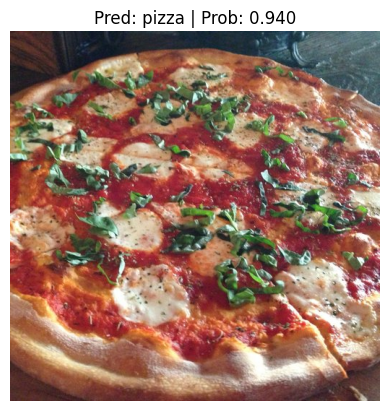

<Figure size 640x480 with 0 Axes>

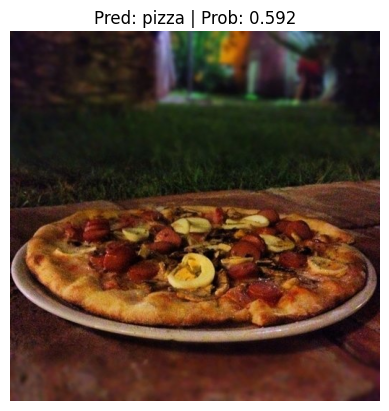

<Figure size 640x480 with 0 Axes>

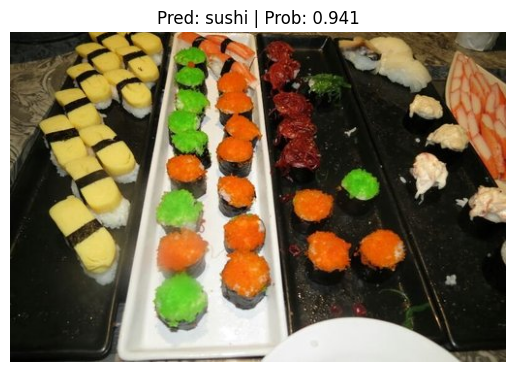

<Figure size 640x480 with 0 Axes>

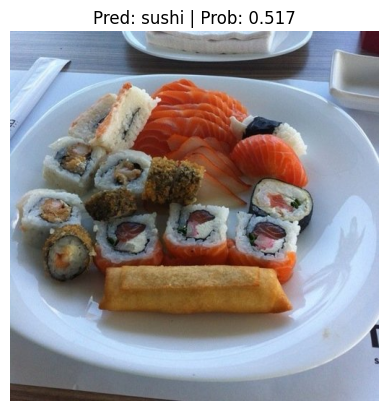

<Figure size 640x480 with 0 Axes>

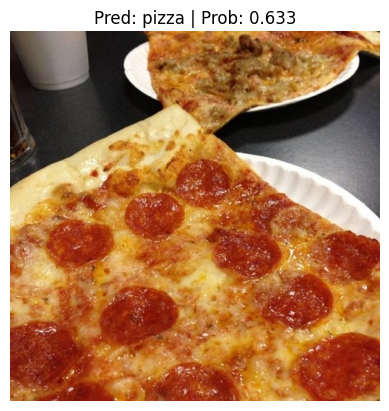

In [44]:
import random
import matplotlib.pyplot as plt
from going_modular.going_modular.predictions import pred_and_plot_image

paths = list(test_dir.glob('*/*.jpg'))
n = 5
paths = random.sample(paths, k=n)

for path in paths:
  plt.figure()
  print(path)
  pred_and_plot_image(best_model,
                      class_names,
                      path,
                      transform=manual_transform)